<a href="https://colab.research.google.com/github/OsyaginVictor/OsyaginVictor/blob/main/images_on_request.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Прекод

## Сборный проект-4

Вам поручено разработать демонстрационную версию поиска изображений по запросу.

Для демонстрационной версии нужно обучить модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — покажет, насколько текст и картинка подходят друг другу.

Описание данных
Данные находятся здесь.

В файле train_dataset.csv собрана информация, необходимая для обучения: имя файла изображения, идентификатор описания и текст описания. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат <имя файла изображения>#<порядковый номер описания>.

В папке train_images содержатся изображения для тренировки модели.

В файле CrowdAnnotations.tsv — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:

Имя файла изображения.
Идентификатор описания.
Доля людей, подтвердивших, что описание соответствует изображению.
Количество человек, подтвердивших, что описание соответствует изображению.
Количество человек, подтвердивших, что описание не соответствует изображению.
В файле ExpertAnnotations.tsv содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:

Имя файла изображения.
Идентификатор описания.
3, 4, 5 — оценки трёх экспертов.

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

В файле test_queries.csv находится информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат <имя файла изображения>#<порядковый номер описания>.

В папке test_images содержатся изображения для тестирования модели.

Импортируем библиотеки, которые нужны будут для решения задачи.

In [1]:
import tensorflow as tf
import os
import zipfile
import cv2

import time


from tqdm.notebook import tqdm
tqdm.pandas()

from PIL import Image
from pathlib import Path

import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import random
import matplotlib.image as mpimg

from sklearn.model_selection import train_test_split, GridSearchCV, GroupShuffleSplit
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import ElasticNetCV,ElasticNet
from sklearn.dummy import DummyRegressor
from sklearn.metrics import log_loss, mean_squared_error
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import make_scorer
from lightgbm import LGBMRegressor

import re
import nltk
from nltk.corpus import wordnet
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords as nltk_stopwords


import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models
from torchvision import transforms
from tensorflow.keras.metrics import RootMeanSquaredError
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, GlobalAveragePooling2D, Conv2D, MaxPooling2D, BatchNormalization, Reshape, RepeatVector, LSTM, Dropout
from tensorflow.keras.optimizers import Adam

import spacy

import warnings
warnings.filterwarnings('ignore')
pd.options.mode.chained_assignment = None # для игнорирования предупреждения
# уберем ограничения на количество выводимых столбцов, что бы просмотреть все столбцы
pd.set_option('display.max_columns', None)

In [2]:
nltk.download('wordnet')
nltk.download('omw-1.4')
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


True

# 1. Исследовательский анализ данных

Наш датасет содержит экспертные и краудсорсинговые оценки соответствия текста и изображения.

В файле с экспертными мнениями для каждой пары изображение-текст имеются оценки от трёх специалистов. Для решения задачи вы должны эти оценки агрегировать — превратить в одну. Существует несколько способов агрегации оценок, самый простой — голосование большинства: за какую оценку проголосовала большая часть экспертов (в нашем случае 2 или 3), та оценка и ставится как итоговая. Поскольку число экспертов меньше числа классов, может случиться, что каждый эксперт поставит разные оценки, например: 1, 4, 2. В таком случае данную пару изображение-текст можно исключить из датасета.

Вы можете воспользоваться другим методом агрегации оценок или придумать свой.

В файле с краудсорсинговыми оценками информация расположена в таком порядке:

Доля исполнителей, подтвердивших, что текст соответствует картинке.
Количество исполнителей, подтвердивших, что текст соответствует картинке.
Количество исполнителей, подтвердивших, что текст не соответствует картинке.
После анализа экспертных и краудсорсинговых оценок выберите либо одну из них, либо объедините их в одну по какому-то критерию: например, оценка эксперта принимается с коэффициентом 0.6, а крауда — с коэффициентом 0.4.

Ваша модель должна возвращать на выходе вероятность соответствия изображения тексту, поэтому целевая переменная должна иметь значения от 0 до 1.

Для удобства - сделаем вынос пути к данным в отдельную константу.

In [3]:
PATH = '/content/dsplus_integrated_project_4.zip'

Для упрощения поиска нужных нам файлов, напишем код, который будет показывать содержимое архива и уточнения наличия нужного файла в нем.

In [4]:
with zipfile.ZipFile(PATH, 'r') as zip_ref:
    file_list = zip_ref.namelist()
    print(file_list)

['to_upload/', 'to_upload/test_images/', 'to_upload/test_images.csv', '__MACOSX/to_upload/._test_images.csv', 'to_upload/.DS_Store', '__MACOSX/to_upload/._.DS_Store', 'to_upload/train_dataset.csv', '__MACOSX/to_upload/._train_dataset.csv', 'to_upload/ExpertAnnotations.tsv', '__MACOSX/to_upload/._ExpertAnnotations.tsv', 'to_upload/CrowdAnnotations.tsv', '__MACOSX/to_upload/._CrowdAnnotations.tsv', 'to_upload/train_images/', 'to_upload/test_queries.csv', '__MACOSX/to_upload/._test_queries.csv', 'to_upload/test_images/3459871361_92d1ecda36.jpg', '__MACOSX/to_upload/test_images/._3459871361_92d1ecda36.jpg', 'to_upload/test_images/3044745642_1d0784ff29.jpg', '__MACOSX/to_upload/test_images/._3044745642_1d0784ff29.jpg', 'to_upload/test_images/1468389504_c724bdcad0.jpg', '__MACOSX/to_upload/test_images/._1468389504_c724bdcad0.jpg', 'to_upload/test_images/3044359043_627488ddf0.jpg', '__MACOSX/to_upload/test_images/._3044359043_627488ddf0.jpg', 'to_upload/test_images/3514297698_0512623955.jpg',

Разархивируем полностью папку to_upload.

In [5]:
with zipfile.ZipFile(PATH, 'r') as zip_ref:
    zip_ref.extractall('/content/')

В файле train_dataset.csv находится информация, необходимая для обучения: имя файла изображения, идентификатор описания и текст описания. Передадим его переменной и посмотрим на информацию по датасету.

In [6]:
df = pd.read_csv('/content/to_upload/train_dataset.csv')

In [7]:
print('Данные')
display(df.head(8))
print('\n')
print('Размер датасета:', df.shape)
print('\n')
print('Информация\n')
print(df.info())

Данные


,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
5,3030566410_393c36a6c5.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
6,3155451946_c0862c70cb.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
7,3222041930_f642f49d28.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...




Размер датасета: (5822, 3)


Информация

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB
None


Далее откроем файл с экспертными оценками и посмотрим информацию по нему.

In [8]:
df_expert = pd.read_csv('/content/to_upload/ExpertAnnotations.tsv' ,
                          sep='\t',
                          names = ['image', 'query_id', 'first_exp', 'second_exp', 'third_exp'])

In [9]:
print('Данные')
display(df_expert.head(8))
print('\n')
print('Размер датасета:', df_expert.shape)
print('\n')
print('Информация\n')
print(df_expert.info())
print('\n')
print(df_expert.describe())

Данные


,image,query_id,first_exp,second_exp,third_exp
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2
5,1056338697_4f7d7ce270.jpg,3360930596_1e75164ce6.jpg#2,1,1,1
6,1056338697_4f7d7ce270.jpg,3545652636_0746537307.jpg#2,1,1,1
7,1056338697_4f7d7ce270.jpg,434792818_56375e203f.jpg#2,1,1,2




Размер датасета: (5822, 5)


Информация

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   first_exp   5822 non-null   int64 
 3   second_exp  5822 non-null   int64 
 4   third_exp   5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.5+ KB
None


         first_exp   second_exp    third_exp
count  5822.000000  5822.000000  5822.000000
mean      1.436620     1.624356     1.881999
std       0.787084     0.856222     0.904087
min       1.000000     1.000000     1.000000
25%       1.000000     1.000000     1.000000
50%       1.000000     1.000000     2.000000
75%       2.000000     2.000000     2.000000
max       4.000000     4.000000     4.000000


Таким образом, в нашем наборе данных с экспертными оценками содержится 5822 уникальных комбинаций фотографий и текстов.

Далее откроем файл с краудсорсинговыми оценками и посмотрим информацию по нему.

In [10]:
df_crowd  = pd.read_csv('/content/to_upload/CrowdAnnotations.tsv',
                                                          sep='\t',
                          names=['image', 'query_id', 'share_pos', 'count_pos', 'count_neg'])

In [11]:
print('Данные')
display(df_crowd.head(8))
print('\n')
print('Размер датасета:', df_crowd.shape)
print('\n')
print('Информация\n')
print(df_crowd.info())
print('\n')
print(df_crowd.describe())

Данные


,image,query_id,share_pos,count_pos,count_neg
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.000000,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.000000,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.000000,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.000000,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.000000,0,3
5,1056338697_4f7d7ce270.jpg,2204550058_2707d92338.jpg#2,0.000000,0,3
6,1056338697_4f7d7ce270.jpg,2224450291_4c133fabe8.jpg#2,0.000000,0,3
7,1056338697_4f7d7ce270.jpg,2248487950_c62d0c81a9.jpg#2,0.333333,1,2




Размер датасета: (47830, 5)


Информация

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   image      47830 non-null  object 
 1   query_id   47830 non-null  object 
 2   share_pos  47830 non-null  float64
 3   count_pos  47830 non-null  int64  
 4   count_neg  47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB
None


          share_pos     count_pos     count_neg
count  47830.000000  47830.000000  47830.000000
mean       0.068786      0.208488      2.820155
std        0.207532      0.628898      0.656676
min        0.000000      0.000000      0.000000
25%        0.000000      0.000000      3.000000
50%        0.000000      0.000000      3.000000
75%        0.000000      0.000000      3.000000
max        1.000000      5.000000      6.000000


 Тут, в нашем наборе данных с краудсорсинговыми оценками содержится 47830 уникальных сочетаний фотографий и текстов.

 Далее откроем файл с тестовыми данными и посмотрим информацию по нему.

In [12]:
df_test  = pd.read_csv('/content/to_upload/test_queries.csv', sep='|', index_col=0)

In [13]:
print('Данные')
display(df_test.head(8))
print('\n')
print('Размер датасета:', df_test.shape)
print('\n')
print('Информация\n')
print(df_test.info())
print('\n')
print(df_test.describe())

Данные


,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg
5,1232148178_4f45cc3284.jpg#0,A baby girl playing at a park .,1232148178_4f45cc3284.jpg
6,1232148178_4f45cc3284.jpg#1,A closeup of a child on a playground with adul...,1232148178_4f45cc3284.jpg
7,1232148178_4f45cc3284.jpg#2,A young boy poses for a picture in front of a ...,1232148178_4f45cc3284.jpg




Размер датасета: (500, 3)


Информация

<class 'pandas.core.frame.DataFrame'>
Index: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 15.6+ KB
None


                           query_id  \
count                           500   
unique                          500   
top     1177994172_10d143cb8d.jpg#0   
freq                              1   

                                               query_text  \
count                                                 500   
unique                                                500   
top     Two blonde boys , one in a camouflage shirt an...   
freq                                                    1   

                            image  
count                         500  
unique                        100  
t

Количество уникальных фото в тестовых данных - 100, количество уникальных текстовых комментариев-500

Далее откроем файл с тестовыми фотографиями и посмотрим информацию по нему.

In [14]:
test_images  = pd.read_csv('/content/to_upload/test_images.csv')

In [15]:
test_images.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   100 non-null    object
dtypes: object(1)
memory usage: 928.0+ bytes


Напишем код, который создает график, состоящий из 10 изображений. Он будет брать 10 случайных значений из столбца 'image' в датафрейме df_test, затем для каждого из этих значений открывать изображение из папки 'test_images' и отображать его на графике. Каждое изображение будет отображаться в своей ячейке 2x5 внутри одной общей области построения.

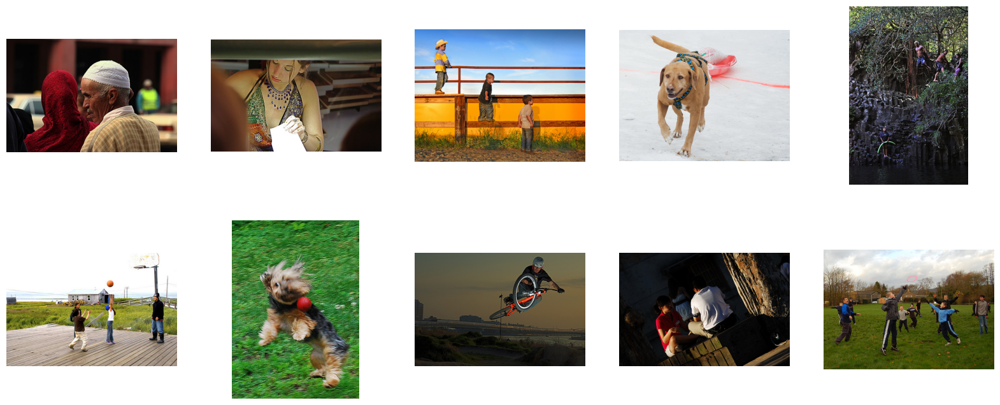

In [16]:
plt.figure(figsize=(20, 8))

# Выбор и отображение случайных изображений
for i in range(10):
    img_path = '/content/to_upload/test_images/' + df_test['image'].sample(1).iloc[0]
    img = mpimg.imread(img_path)
    plt.subplot(2, 5, i + 1)
    plt.imshow(img)
    plt.axis('off')

plt.show()

Тоже самое сделаем с фотографиями для тренировки модели.

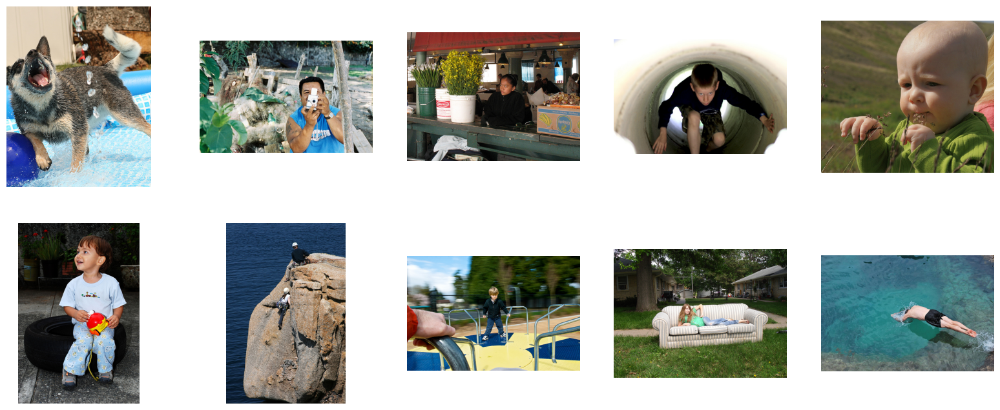

In [17]:
plt.figure(figsize=(20, 8))

# Выбор и отображение случайных изображений
for i in range(10):
    img_path = '/content/to_upload/train_images/' + df['image'].sample(1).iloc[0]
    img = mpimg.imread(img_path)
    plt.subplot(2, 5, i + 1)
    plt.imshow(img)
    plt.axis('off')

plt.show()

Напишем код, который представляет собой функцию под названием voting, которая принимает три аргумента: first, second и third. Функция сравнивает значения этих трех аргументов и возвращает значение, которое встречается больше всего раз.

Если первый аргумент равен второму или третьему, функция вернет значение первого аргумента. Если второй аргумент равен третьему, функция вернет значение второго аргумента. В противном случае, если все три аргумента различны, функция вернет None.

Таким образом, эта функция будет осуществлять простое голосование за наиболее часто встречающееся значение среди трех аргументов.

In [18]:
def voting (first, second, third):
    if first == second or first == third:
        return first
    elif second == third:
        return second
    else:
        return None

Теперь, создадим новый столбец "final_score" в df_expert, используя функцию voting для выполнения голосования между значениями в столбцах 'first_exp', 'second_exp' и 'third_exp' для каждой строки по отдельности.

In [19]:
df_expert['final_score'] = df_expert.apply(lambda x: voting(x['first_exp'], x['second_exp'], x['third_exp']), axis=1)

Согласно заданию, наша модель должна оценивать вероятность соответствия изображения тексту, поэтому целевая переменная должна быть в пределах от 0 до 1. Для этого мы используем MinMaxScaler для нормализации наших исходных данных. Этот этап можно выполнить сейчас, потому что мы заранее знаем минимальные и максимальные значения, и это исключает возможность утечки информации.

In [64]:
## Пробовал не использовать MinMaxScaler результаты метрик оказались значительно хуже, однако это не повлияло на работоспособность модели.


scaler = MinMaxScaler()
df_expert['final_score'] = scaler.fit_transform(df_expert[['final_score']])

In [21]:
print('Данные')
display(df_expert.head(8))
print('\n')
print('Размер датасета:', df_expert.shape)
print('\n')
print('Информация\n')
print(df_expert.info())
print('\n')
print(df_expert.describe())

Данные


,image,query_id,first_exp,second_exp,third_exp,final_score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1,0.000000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2,0.000000
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2,0.000000
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2,0.333333
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2,0.000000
5,1056338697_4f7d7ce270.jpg,3360930596_1e75164ce6.jpg#2,1,1,1,0.000000
6,1056338697_4f7d7ce270.jpg,3545652636_0746537307.jpg#2,1,1,1,0.000000
7,1056338697_4f7d7ce270.jpg,434792818_56375e203f.jpg#2,1,1,2,0.000000




Размер датасета: (5822, 6)


Информация

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   image        5822 non-null   object 
 1   query_id     5822 non-null   object 
 2   first_exp    5822 non-null   int64  
 3   second_exp   5822 non-null   int64  
 4   third_exp    5822 non-null   int64  
 5   final_score  5696 non-null   float64
dtypes: float64(1), int64(3), object(2)
memory usage: 273.0+ KB
None


         first_exp   second_exp    third_exp  final_score
count  5822.000000  5822.000000  5822.000000  5696.000000
mean      1.436620     1.624356     1.881999     0.203827
std       0.787084     0.856222     0.904087     0.286367
min       1.000000     1.000000     1.000000     0.000000
25%       1.000000     1.000000     1.000000     0.000000
50%       1.000000     1.000000     2.000000     0.000000
75%       2.000000     2.000000     2.

Для обучения моделей решил оставить только мнение экспертов.
 Во-первых, эксперты обладают глубоким знанием в своей области и обладают большим опытом, что делает их мнение более авторитетным и надежным. Они могут предоставить ценные исходные данные и помочь избежать ошибок при проведении обучения модели.

Во-вторых, работа с экспертами позволяет получить более качественные и точные результаты, поскольку эксперты могут дать детальные объяснения и контролировать процесс обучения. При этом исключается возможность широкой ошибки, которая может возникнуть при работе с несколькими непроверенными источниками.

Также важно отметить, что при использовании мнения краудсорсинга может возникнуть проблема качества исходных данных из-за различий в знаниях, опыте и мотивации участников. Это может привести к искажению результатов и неправильному обучению модели.

Таким образом, выбор мнения экспертов для обучения модели обычно дает более надежные и точные результаты, что в конечном итоге способствует развитию и улучшению моделей машинного обучения.

In [22]:
#Объединим наши данные
df = pd.merge(df, df_expert[['image', 'query_id', 'final_score']],
                      how='outer', on=['image', 'query_id'])


In [23]:
print('Данные')
display(df.head(8))
print('\n')
print('Размер датасета:', df.shape)
print('\n')
print('Информация\n')
print(df.info())
print('\n')
print(df.describe())

Данные


,image,query_id,query_text,final_score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.333333
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1.000000
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
5,3030566410_393c36a6c5.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.333333
6,3155451946_c0862c70cb.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
7,3222041930_f642f49d28.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000




Размер датасета: (5822, 4)


Информация

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   image        5822 non-null   object 
 1   query_id     5822 non-null   object 
 2   query_text   5822 non-null   object 
 3   final_score  5696 non-null   float64
dtypes: float64(1), object(3)
memory usage: 182.1+ KB
None


       final_score
count  5696.000000
mean      0.203827
std       0.286367
min       0.000000
25%       0.000000
50%       0.000000
75%       0.333333
max       1.000000


Имея окончательный набор данных, можно заметить недостаток экспертных оценок. Избавимся от этих строк.

In [24]:
df = df.dropna(subset=['final_score'])
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5696 entries, 0 to 5821
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   image        5696 non-null   object 
 1   query_id     5696 non-null   object 
 2   query_text   5696 non-null   object 
 3   final_score  5696 non-null   float64
dtypes: float64(1), object(3)
memory usage: 222.5+ KB


Мы загрузили данные для исследования и сделали следующие выводы:

1. Обучающий датасет содержит 5822 строки и три колонки. В нем содержится 1000 уникальных фотографий и 977 уникальных текстовых комментариев.

2. Датасет с тестовыми данными включает 500 строк и три колонки. В нем содержится 100 уникальных фото и 500 уникальных текстовых комментариев.

3. Датасет с тестовыми фотографиями содержит 100 изображений.

4. Мы располагаем 5822 уникальными парами фото-текст в датасете с экспертными оценками.

5. Также в нашем распоряжении 47830 уникальных пар фото-текст в датасете с краудсорсинговыми оценками. Мы разработали функцию для агрегации экспертных оценок с использованием метода голосования большинства. Затем мы объединили обучающий датасет с данными по агрегированным экспертным оценкам, удалили строки без экспертных оценок и получили обучающий датасет из 5696 строк и 4 колонок.

# 2. Проверка данных

Далее, напишем функцию get_wordnet, которая будет использована для определения части речи (POS - part of speech) слова с помощью библиотеки NLTK (Natural Language Toolkit) и WordNet.

Она будет принимать на вход слово word и использует модуль pos_tag из NLTK для определения части речи этого слова. Затем, на основе полученной части речи, функция будет возвращать соответствующий символьный код части речи из WordNet (например, "J" для прилагательного, "N" для существительного, "V" для глагола, "R" для наречия).

Если часть речи слова не соответствует ни одному из указанных кодов, функция по умолчанию возвращает код для существительного (wordnet.NOUN).

Так же, напишем функцию, которая будет выполнять очистку текста от лишних символов, лемматизацию слов и возвращать текст с лемматизированными словами.

Напишем функцию очистки текста.

In [25]:
HTML_TAGS = r'<.*?>'  # html тэги меняем на пробел
TAGS = r'{.*?}'  # тэги меняем на пробел
COMMENTS = r'[\(\[][A-Za-z ]+[\)\]]'  # комменты в скобках меняем на пробел
LETTERS = r'[^a-zA-Z\'.,!? ]'  # все, что не буквы, меняем на пробел
SPACES = r'([ ])\1+'  # повторяющиеся пробелы меняем на один пробел
DOTS = r'[\.]+'  # многоточие меняем на точку
SYMBOLS = r"[^\w\d'\s]"  # знаки препинания кроме апострофа

def clean_text(sentence):
    sentence = sentence.lower()  # текст в нижний регистр
    sentence = re.sub('\W', ' ', sentence)
    sentence = re.sub('\s+', ' ', sentence)
    sentence = re.sub(r'\n', ' ', sentence)
    sentence = re.sub(HTML_TAGS, ' ', sentence)  # html тэги меняем на пробел
    sentence = re.sub(TAGS, ' ', sentence)  # тэги меняем на пробел
    sentence = re.sub(COMMENTS, ' ', sentence)  # комменты в скобках меняем на пробел
    sentence = re.sub(LETTERS, ' ', sentence)  # все, что не буквы, меняем на пробел
    sentence = re.sub(DOTS, r'.', sentence)  # многоточие меняем на точку
    sentence = re.sub(SPACES, r'\1', sentence)  # повторяющиеся пробелы меняем на один пробел
    sentence = re.sub(SYMBOLS, '', sentence)  # знаки препинания кроме апострофа на пустую строку

    replacements = {
        "he's": "he is",
        "she's": "she is",
        "it's ": "it is",
        "we're": "we are",
        "they're": "they are"
    }

    for key, value in replacements.items():
        sentence = sentence.replace(key, value)

    sentence = sentence.strip()
    cleaned_sentence = " ".join(sentence.split())

    return cleaned_sentence

In [26]:
df['query_text'] = df['query_text'].progress_apply(clean_text)

  0%|          | 0/5696 [00:00<?, ?it/s]

In [27]:
nlp = spacy.load("en_core_web_sm", disable=['parser', 'ner'])# Initialize spacy 'en' model, keeping only tagger component needed for lemmatization
def spacy_lemm(sentence):
    doc = nlp(sentence)
    return " ".join([token.lemma_ for token in doc])

df['query_text'] = df['query_text'].progress_apply(spacy_lemm)

  0%|          | 0/5696 [00:00<?, ?it/s]

In [28]:
df

,image,query_id,query_text,final_score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,a young child be wear blue goggle and sit in a...,0.000000
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,a young child be wear blue goggle and sit in a...,0.000000
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,a young child be wear blue goggle and sit in a...,0.333333
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,a young child be wear blue goggle and sit in a...,1.000000
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,a young child be wear blue goggle and sit in a...,0.000000
...,...,...,...,...
5817,757046028_ff5999f91b.jpg,2061144717_5b3a1864f0.jpg#2,a man in an ampitheater talk to a boy,0.333333
5818,799486353_f665d7b0f0.jpg,2196107384_361d73a170.jpg#2,a old man walk down the uncrowded road,0.000000
5819,909808296_23c427022d.jpg,2112921744_92bf706805.jpg#2,a dog stand on the side of a grassy cliff,0.333333
5820,929679367_ff8c7df2ee.jpg,3651971126_309e6a5e22.jpg#2,a blurry photo of two dog,0.666667


В некоторых странах, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.

Зайдя на сайт https://www.powerthesaurus.org - выберем самые распространенные синонимы слова 'child' и сделаем из них стоп слова.

Напишем функцию, которая проверяет, содержит ли переданный текст какое-либо из "запретных" слов, определенных в переменной stop_words. Она будет инициализировать переменную result сначала как False, а затем проходить по каждому слову в списке stop_words, выполняя проверку наличия этого слова в тексте через метод find(). Если хотя бы одно из "запретных" слов найдено в тексте, то переменная result становится True. В конце функция возвращает значение True, если хотя бы одно "запретное" слово было найдено, иначе возвращает False.

In [29]:
def stop_words_clean(text: str, stop_words: list) -> bool:
    result = False
    for word in stop_words:
        result |= text.find(word) > -1
    return result

stop_words = [
    'boy','boys',
    'minor',
    'girl','girls',
    'babe',
    'nipper',
    'shaver',
    'tyke',
    'little kid',
    'little one',
    'child','children',
    'baby','babies',
    'kid','kids',
    'infant',
    'toddler',
    'teenager',
    'teeny',
    'teener',
    'newborn',
    'classmate',
    'schoolboy',
    'pupil',
    'schoolchild',
    'schoolkid',
    'suckling',
    'teenybopper',
    'juvenile',
    'stripling']  # Заменить на ваш список стоп-слов

df['children'] = df.apply(lambda x: stop_words_clean(x['query_text'], stop_words), axis=1)

In [30]:
df.head(8)

,image,query_id,query_text,final_score,children
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,a young child be wear blue goggle and sit in a...,0.000000,True
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,a young child be wear blue goggle and sit in a...,0.000000,True
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,a young child be wear blue goggle and sit in a...,0.333333,True
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,a young child be wear blue goggle and sit in a...,1.000000,True
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,a young child be wear blue goggle and sit in a...,0.000000,True
5,3030566410_393c36a6c5.jpg,2549968784_39bfbe44f9.jpg#2,a young child be wear blue goggle and sit in a...,0.333333,True
6,3155451946_c0862c70cb.jpg,2549968784_39bfbe44f9.jpg#2,a young child be wear blue goggle and sit in a...,0.000000,True
7,3222041930_f642f49d28.jpg,2549968784_39bfbe44f9.jpg#2,a young child be wear blue goggle and sit in a...,0.000000,True


Разделим наш датасет, посмотрим на данные только с детьми

In [31]:
guery_id_with_children = set(df[df['children'] == True]['query_id'])

Извлечем подстроки из элементов списка guery_id_with_children, не включая последние два символа, и добавим их в список и множество соответственно.

In [32]:
image_with_children = list([i[:-2] for i in guery_id_with_children])
image_with_children_=set([i[:-2] for i in guery_id_with_children])

А теперь посмотрим на фотографии.

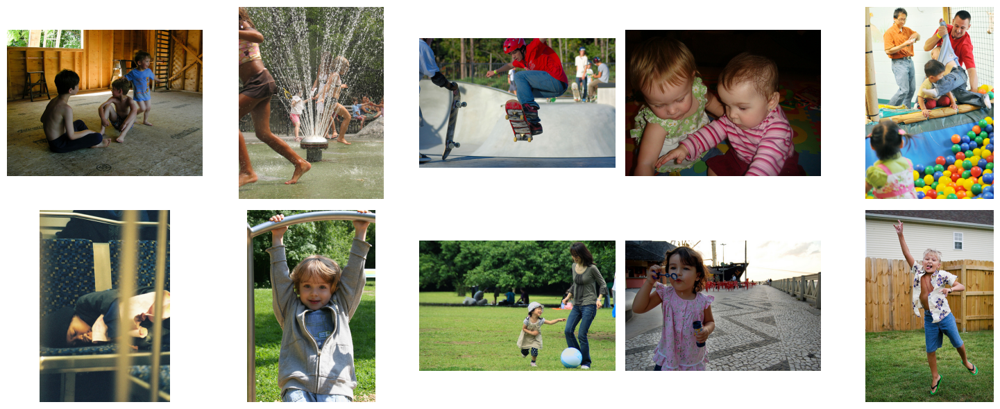

In [33]:
fig, axs = plt.subplots(2, 5, figsize=(15, 6))

for i in range(10):
    image_path = os.path.join(PATH, '/content/to_upload/train_images/', image_with_children[i])
    image = Image.open(image_path)
    row = i // 5
    col = i % 5
    axs[row, col].imshow(image)
    axs[row, col].axis('off')

plt.tight_layout()
plt.show()

Рассмотрев изображения внимательно, можно сделать вывод, что на них присутствуют дети и подростки, что подтверждает правильность нашего предварительного отбора. Поэтому исключим эти фотографии из набора данных для обучения.

In [34]:
df = df.drop(df[df['image'].isin(image_with_children_)].index, axis=0)
df.reset_index(inplace=True, drop=True)

In [35]:
print('Данные')
display(df.head(8))
print('\n')
print('Размер датасета:', df.shape)
print('\n')
print('Информация\n')
print(df.info())

Данные


,image,query_id,query_text,final_score,children
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,a young child be wear blue goggle and sit in a...,0.0,True
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,a young child be wear blue goggle and sit in a...,0.0,True
2,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,a young child be wear blue goggle and sit in a...,0.0,True
3,3155451946_c0862c70cb.jpg,2549968784_39bfbe44f9.jpg#2,a young child be wear blue goggle and sit in a...,0.0,True
4,3222041930_f642f49d28.jpg,2549968784_39bfbe44f9.jpg#2,a young child be wear blue goggle and sit in a...,0.0,True
5,343218198_1ca90e0734.jpg,2549968784_39bfbe44f9.jpg#2,a young child be wear blue goggle and sit in a...,0.0,True
6,3718964174_cb2dc1615e.jpg,2549968784_39bfbe44f9.jpg#2,a young child be wear blue goggle and sit in a...,0.0,True
7,486712504_36be449055.jpg,2549968784_39bfbe44f9.jpg#2,a young child be wear blue goggle and sit in a...,0.0,True




Размер датасета: (3980, 5)


Информация

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3980 entries, 0 to 3979
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   image        3980 non-null   object 
 1   query_id     3980 non-null   object 
 2   query_text   3980 non-null   object 
 3   final_score  3980 non-null   float64
 4   children     3980 non-null   bool   
dtypes: bool(1), float64(1), object(3)
memory usage: 128.4+ KB
None


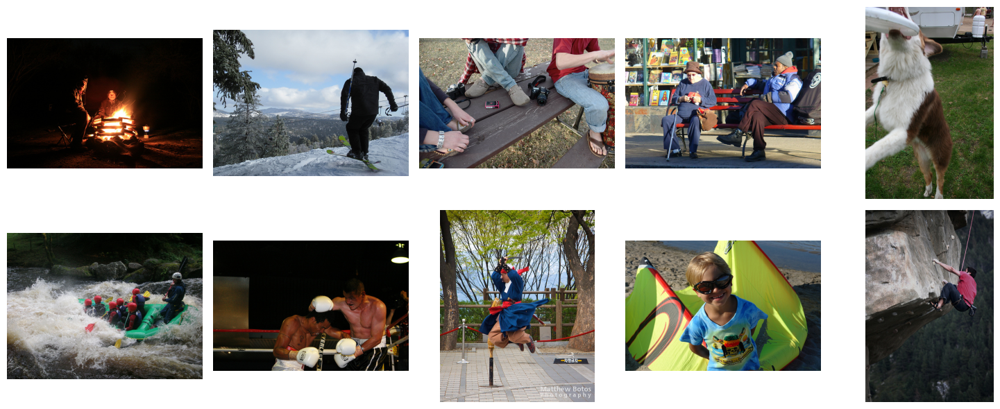

In [36]:
train_image = list(df['image'].sample(10))

fig, axs = plt.subplots(2, 5, figsize=(15, 6))

for i in range(10):
    image_path = os.path.join(PATH, '/content/to_upload/train_images/', train_image[i])
    image = Image.open(image_path)
    row = i // 5
    col = i % 5
    axs[row, col].imshow(image)
    axs[row, col].axis('off')

plt.tight_layout()
plt.show()

### Промежуточный вывод

Мы провели анализ информации и создали список терминов, обозначающих детей или группы детей в возрасте до 16 лет, которые запрещены. После всех изменений и удаления данных у нас осталось всего 3980 комбинаций изображений с пояснениями.

# 3. Векторизация изображений

Далее перейдем к преобразованию изображений в векторный формат.

Наиболее простой метод заключается в считывании изображения и преобразовании его матрицы в вектор. Однако данный подход не всегда удобен, так как длина полученных векторов может сильно различаться из-за различных размеров изображений. Поэтому целесообразно обратиться к использованию сверточных нейронных сетей: они способны выделять ключевые особенности изображений. Для этого необходимо выбрать определенную архитектуру, например, ResNet-50, изучить ее слои и исключить полносвязанные слои, ответственные за итоговое предсказание. Кроме того, можно воспользоваться моделью этой архитектуры, заранее обученной на наборе данных ImageNet.

In [37]:
resnet = models.resnet50(pretrained=True)

for param in resnet.parameters():
    param.requires_grad_(False)

print(list(resnet.children()))
# возьмем все слои кроме последнего, т.к. размер вектора слишком большой
modules = list(resnet.children())[:-1]
resnet = nn.Sequential(*modules)

resnet.eval()

[Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False), BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True), ReLU(inplace=True), MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False), Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (downsample): Sequential(
      (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=Tr

Sequential(
  (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace=True)
  (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (4): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)


Напишем код, который будет представлять собой пример трансформации изображения с использованием библиотеки PyTorch. Этот код будет определять последовательность преобразований, которая позволит подготовить изображения для использования в моделях обучения, включая нормализацию и изменение размера изображения до стандартных размеров.

In [38]:
norm = transforms.Normalize(
    mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    norm,
])

In [39]:
df_vect_image = []
for i in df['image']:
    img = Image.open(os.path.join(PATH, '/content/to_upload/train_images/', i)).convert('RGB')
    image_tensor = preprocess(img)
    df_vect_image.append(resnet(image_tensor.unsqueeze(0)).flatten().numpy())

In [40]:
print(f'Размер векторизованных изображений: {len(df_vect_image)} x {len(df_vect_image[0])}')

Размер векторизованных изображений: 3980 x 2048


С помощью сверточной нейронной сети ResNet-50, уже обученной на наборе данных ImageNet, мы преобразовали изображения из тренировочного набора данных в векторное представление.

# 4. Векторизация текстов

Для векторизации текстов будем использовать уже привычный tf-idf.

In [41]:
stopwords = list(nltk_stopwords.words('english'))

count_tf_idf = TfidfVectorizer(stop_words=stopwords,analyzer='word')

In [42]:
train_corpus = df['query_text'].values
text_vect = count_tf_idf.fit_transform(train_corpus)
txt_vect = text_vect.toarray()
text_vect.shape

(3980, 1155)

# 5.Объединение векторов

In [44]:
features = np.hstack([np.vstack(df_vect_image), txt_vect])
target = np.array(df['final_score'])

In [45]:
features.shape

(3980, 3203)

In [46]:
target.shape

(3980,)

Мы объединили векторные представления изображений и текстов для создания признаков, которые будут использоваться в дальнейшей работе с моделями. Также мы определили целевой признак, который будет использоваться для обучения и оценки эффективности наших моделей.

# 6. Обучение модели предсказания соответствия

Для обучения разделите датасет на тренировочную и тестовую выборки. Простое случайное разбиение не подходит: нужно исключить попадание изображения и в обучающую, и в тестовую выборки. Для того чтобы учесть изображения при разбиении, можно воспользоваться классом GroupShuffleSplit из библиотеки sklearn.model_selection.

Код ниже разбивает датасет на тренировочную и тестовую выборки в пропорции 7:3 так, что строки с одинаковым значением 'group_column' будут содержаться либо в тестовом, либо в тренировочном датасете.

from sklearn.model_selection import GroupShuffleSplit
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=42)
train_indices, test_indices = next(gss.split(X=df.drop(columns=['target']), y=df['target'], groups=df['group_column']))
train_df, test_df = df.loc[train_indices], df.loc[test_indices]

Какую модель использовать — выберите самостоятельно. Также вам предстоит выбрать метрику качества либо реализовать свою.

Я решил использовать RMSE в качестве метрики оценки точности прогноза. Этот показатель демонстрирует среднее значение отклонения прогноза от фактических данных с учетом значений ошибок в квадрате. RMSE более чувствителен к выбросам в данных и удобен тем, что его значения имеют ту же размерность, что и исходные переменные.

In [47]:
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=42)
train_indices, test_indices = next(gss.split(X=features, y=df['final_score'], groups=df['image']))
features_train = features[train_indices]
features_test = features[test_indices]
target_train = target[train_indices]
target_test =  target[test_indices]

 Выполним процесс стандартизации данных с использованием StandardScaler.

In [48]:
scaler = StandardScaler()
scaler.fit(features_train)
features_train = scaler.transform(features_train)
features_test = scaler.transform(features_test)

## ElasticNet

Напишем линейную модель ElasticNet в которой будет задаваться сетка параметров param_grid, которая содержит значения для параметров alpha (коэффициент регуляризации) и l1_ratio (соотношение L1 к общей регуляризации).  
Это позволит лучше учитывать особенности данных и достигать более точных прогнозов при анализе и обработке данных.

In [49]:
model_elastic = ElasticNet(random_state=123456)

# Задаем сетку параметров для поиска
param_grid = {
    'alpha': [0.0001, 0.001, 0.01, 0.1, 1],
    'l1_ratio': [0.1, 0.3, 0.5, 0.7, 0.9]
}

# Инициализируем GridSearchCV
grid_search = GridSearchCV(model_elastic, param_grid, cv=5, scoring='neg_mean_squared_error')

# Обучаем модель
grid_search.fit(features_train, target_train)

# Получаем наилучшие параметры
best_params = grid_search.best_params_

# Создаем модель с наилучшими параметрами
best_model = ElasticNet(alpha=best_params['alpha'], l1_ratio=best_params['l1_ratio'], random_state=123456)
best_model.fit(features_train, target_train)

# Делаем предсказание
predictions_e = best_model.predict(features_test)

# Выводим RMSE
print('RMSE =', '{:.4f}'.format(np.sqrt(mean_squared_error(target_test, predictions_e))))

RMSE = 0.2680


 ## LightGBM

Напишем код, который выполняет поиск наилучших гиперпараметров для модели LightGBM с использованием метода Grid Search и метрики отрицательного RMSE

In [50]:
%%time
def neg_rmse(y_true, y_pred):
    mse = np.mean((y_true - y_pred) ** 2)
    rmse = np.sqrt(mse)
    return -rmse

neg_rmse_scorer = make_scorer(neg_rmse)

LGBM_model = LGBMRegressor(random_state=42, n_jobs=-1, num_leaves=5)
LGBM_params = {
    'learning_rate': [0.1],
    'max_depth': [10, 15],
    'n_estimators': [10, 50, 100]
}

grid_LGBM = GridSearchCV(LGBM_model, LGBM_params, scoring=neg_rmse_scorer, cv=5)
grid_LGBM.fit(features_train, target_train)
best_rmse = ((grid_LGBM.best_score_) * -1) ** 0.5
print('\n')
print("Best RMSE: ", best_rmse)

print("Best parameters: ", grid_LGBM.best_params_)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.209997 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 513659
[LightGBM] [Info] Number of data points in the train set: 2213, number of used features: 2178
[LightGBM] [Info] Start training from score 0.221871
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.199665 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 515042
[LightGBM] [Info] Number of data points in the train set: 2213, number of used features: 2179
[LightGBM] [Info] Start training from score 0.226841
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.189375 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 514741
[LightGBM] [Info] Number of data points in the train set: 2214, number of used features: 2184
[LightGBM] [Info] 

## Нейронная сеть

Выполним реализацию нейронной сети с использованием библиотеки PyTorch.

1. Сделаем преобразование признаков и целевой переменной в формат тензоров PyTorch.
2. Создадим загрузчика данных для обучения.
3. Выполним определение класса ImprovedNet, представляющего собой нейронную сеть с двумя скрытыми слоями и активацией ReLU. В классе также выполняется инициализация весов слоев с помощью метода Xavier и определение последовательности прямого прохода сети.
4. Напишем определение параметров сети (количество нейронов во входном слое, скрытых слоях и выходном слое).
5. Выполним создание экземпляра сети ImprovedNet и определение оптимизатора (Adam) и функции потерь (MSELoss).
6. Проведем обучение сети за заданное количество эпох. В каждой эпохе проходятся все батчи загруженных данных, вычисляется потеря и производится обновление параметров сети.
7. Напишем периодический вывод значения итерации и RMSE метрики на тестовом наборе данных.
8. Рассчитаем среднее значение RMSE по всем итерациям и выводится на экран.


In [51]:
X_train = torch.FloatTensor(features_train)
X_test = torch.FloatTensor(features_test)
y_train = torch.FloatTensor(target_train)
y_test = torch.FloatTensor(target_test)

train_dataset = torch.utils.data.TensorDataset(X_train, y_train)
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=32, shuffle=True)

In [54]:
class Net(nn.Module):
    def __init__(self, n_in_neurons, n_hidden_neurons_1, n_hidden_neurons_2, n_out_neurons):
        super(Net, self).__init__()
        self.fc1 = nn.Linear(n_in_neurons, n_hidden_neurons_1)
        self.bn1 = nn.BatchNorm1d(n_hidden_neurons_1)
        self.act1 = nn.LeakyReLU()
        self.fc2 = nn.Linear(n_hidden_neurons_1, n_hidden_neurons_2)
        self.bn2 = nn.BatchNorm1d(n_hidden_neurons_2)
        self.act2 = nn.LeakyReLU()
        self.fc3 = nn.Linear(n_hidden_neurons_2, n_out_neurons)
        self.act3 = nn.LeakyReLU()
        nn.init.kaiming_uniform_(self.fc1.weight)
        nn.init.kaiming_uniform_(self.fc2.weight)
        nn.init.kaiming_uniform_(self.fc3.weight)

    def forward(self, x):
        x = self.fc1(x)
        x = self.bn1(x)
        x = self.act1(x)
        x = self.fc2(x)
        x = self.bn2(x)
        x = self.act2(x)
        x = self.fc3(x)
        x = self.act3(x)
        return x

X_train = torch.FloatTensor(features_train)
X_test = torch.FloatTensor(features_test)
y_train = torch.FloatTensor(target_train)
y_test = torch.FloatTensor(target_test)

n_in_neurons = X_train.shape[1]
n_hidden_neurons_1 = 512
n_hidden_neurons_2 = 64
n_out_neurons = 1

net = Net(n_in_neurons, n_hidden_neurons_1, n_hidden_neurons_2, n_out_neurons)
optimizer = optim.Adam(net.parameters(), lr=9e-3)
loss = nn.MSELoss()
num_epochs = 300
all_scores = []

for epoch in range(num_epochs):
    for data, target in train_loader:
        optimizer.zero_grad()
        output = net(data)
        batch_loss = loss(output.flatten(), target)
        batch_loss.backward()
        optimizer.step()

    if epoch % 10 == 0 or epoch == num_epochs - 1:
        net.eval()
        with torch.no_grad():
            valid_preds = net(X_test).flatten()
        RMSE_loss = torch.sqrt(loss(valid_preds, y_test))
        all_scores.append(RMSE_loss.item())
        print(f'Epoch: {epoch} | RMSE: {RMSE_loss}')

mean_RMSE = sum(all_scores) / len(all_scores)
print('Средняя RMSE метрика =', mean_RMSE)

Epoch: 0 | RMSE: 0.374594509601593
Epoch: 10 | RMSE: 0.2687254250049591
Epoch: 20 | RMSE: 0.2717234790325165
Epoch: 30 | RMSE: 0.26916682720184326
Epoch: 40 | RMSE: 0.2693386375904083
Epoch: 50 | RMSE: 0.27707013487815857
Epoch: 60 | RMSE: 0.28435805439949036
Epoch: 70 | RMSE: 0.2795209586620331
Epoch: 80 | RMSE: 0.2765083909034729
Epoch: 90 | RMSE: 0.2729073762893677
Epoch: 100 | RMSE: 0.2732914388179779
Epoch: 110 | RMSE: 0.2821585536003113
Epoch: 120 | RMSE: 0.27938660979270935
Epoch: 130 | RMSE: 0.2749371826648712
Epoch: 140 | RMSE: 0.27278003096580505
Epoch: 150 | RMSE: 0.26689091324806213
Epoch: 160 | RMSE: 0.27333495020866394
Epoch: 170 | RMSE: 0.271151602268219
Epoch: 180 | RMSE: 0.2890969514846802
Epoch: 190 | RMSE: 0.2775569558143616
Epoch: 200 | RMSE: 0.2771288752555847
Epoch: 210 | RMSE: 0.28137636184692383
Epoch: 220 | RMSE: 0.2733866572380066
Epoch: 230 | RMSE: 0.274497389793396
Epoch: 240 | RMSE: 0.27473554015159607
Epoch: 250 | RMSE: 0.2742668092250824
Epoch: 260 | RMSE

## DummyRegressor

Используем модель DummyRegressor с стратегией "median" для прогнозирования результатов на тестовом наборе данных

In [55]:
# Создаем и обучаем модель со стратегией 'median'
dummy = DummyRegressor(strategy='median')
dummy.fit(features_train, target_train)

# Делаем предсказания на тестовых данных
predictions_dummy = dummy.predict(features_test)

# Вычисляем среднеквадратичную ошибку и выводим ее с округлением до 4 знаков после запятой
rmse = np.sqrt(mean_squared_error(target_test, predictions_dummy))
print('RMSE =', '{:.4f}'.format(rmse))

RMSE = 0.3707


## Промежуточный вывод по моделям

Мы протестировали несколько алгоритмов машинного обучения: DummyRegressor, LightGBM, ElasticNet и один из них - Нейронная сеть, продемонстрировала наилучшие результаты, показав значение RMSE равное 0.279. Именно этот метод мы выберем для дальнейших экспериментов и тестирования.

## 7. Тестирование модели

Для начала нужно получить векторные представления изображений из DataFrame df_test с использованием модели ResNet.

In [56]:
test_image_vect = []
for i in df_test['image'].unique():
    img = Image.open(os.path.join(PATH, '/content/to_upload/test_images/', i)).convert('RGB')
    image_tensor = preprocess(img)
    test_image_vect.append(resnet(image_tensor.unsqueeze(0)).flatten().numpy())

In [57]:
test_image_vect = np.vstack(test_image_vect)

In [58]:
test_image_vect.shape

(100, 2048)

In [59]:
#получим 10 случайных запрсов из файла test_queries.csv:
random_request= df_test['query_text'].sample(10, random_state=42)
random_request

361    A group of girls who are gothically dressed st...
73     A woman and girl riding downhill on a sled wit...
374                                 The dog is running .
155    A group of people are ice skating in a big city .
104    Little kid in blue coat and hat riding a tricy...
394         Two black dogs fighting over an orange toy .
377        A dog jumping for a tennis ball near an ocean
124                          Boy flying a distant kite .
68                          kids play ultimate Frisbee .
450               A girl in a purple shirt feeding ducks
Name: query_text, dtype: object

Теперь начнем тест модели

In [62]:
def predict_test_net(text):
    print(f'Введенная фраза:{text}')
    text_cleaned = clean_text(text)
    text_lemm = spacy_lemm(text_cleaned)
    for word in text_lemm.split():
        if word in stop_words:
            return print('This image is unavailable in your country in compliance with local laws')

    text_vector = count_tf_idf.transform([spacy_lemm(text)]).toarray()
    features_test_ = np.column_stack((test_image_vect, np.resize(text_vector, (test_image_vect.shape[0], 1155))))

    features_test_ = scaler.transform(features_test_)
    X = torch.FloatTensor(features_test_)
    net.eval()
    pred_test = net.forward(X).flatten().reshape([-1]).detach().numpy()

    data = pd.concat((test_images, pd.Series(np.reshape(pred_test, (pred_test.shape[0],)), name='pred')), axis=1)
    top = list(data.sort_values(by='pred', ascending=False)['image'].head(7))
    top_score = list(data.sort_values(by='pred', ascending=False)['pred'].head(7))
    fig = plt.figure(figsize=(15,5))
    plt.figure(figsize=(18, 6))  # Изменим размер графика

    for i in range(7):
        plt.subplot(1, 7, i+1)
        plt.title(f'Score: {round(top_score[i], 2)}')  # Добавим оценку к заголовку
        image = Image.open(Path(PATH, '/content/to_upload/test_images/', top[i]))
        plt.imshow(image)
        plt.axis('off')  # Уберем оси координат

    plt.tight_layout()
    plt.show()

Введенная фраза:A group of girls who are gothically dressed standing together
This image is unavailable in your country in compliance with local laws
___________________________________________________________________________________
Введенная фраза:A woman and girl riding downhill on a sled with a dog running alongside them
This image is unavailable in your country in compliance with local laws
___________________________________________________________________________________
Введенная фраза:The dog is running .


<Figure size 1500x500 with 0 Axes>

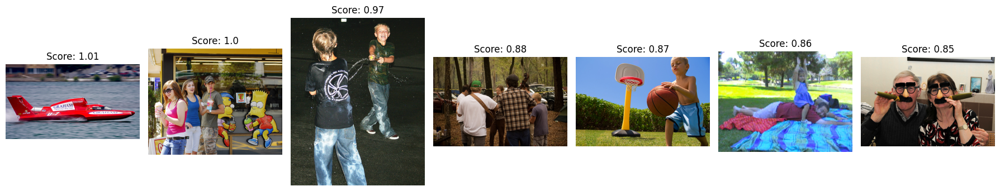

___________________________________________________________________________________
Введенная фраза:A group of people are ice skating in a big city .


<Figure size 1500x500 with 0 Axes>

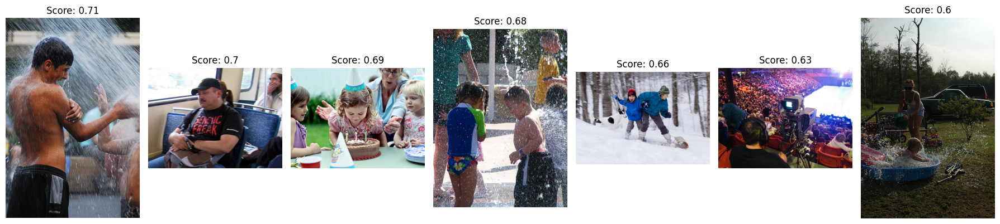

___________________________________________________________________________________
Введенная фраза:Little kid in blue coat and hat riding a tricycle .
This image is unavailable in your country in compliance with local laws
___________________________________________________________________________________
Введенная фраза:Two black dogs fighting over an orange toy .


<Figure size 1500x500 with 0 Axes>

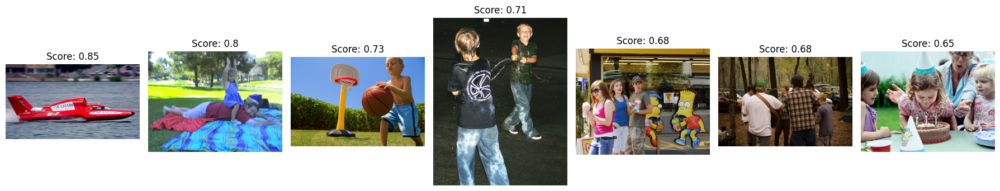

___________________________________________________________________________________
Введенная фраза:A dog jumping for a tennis ball near an ocean


<Figure size 1500x500 with 0 Axes>

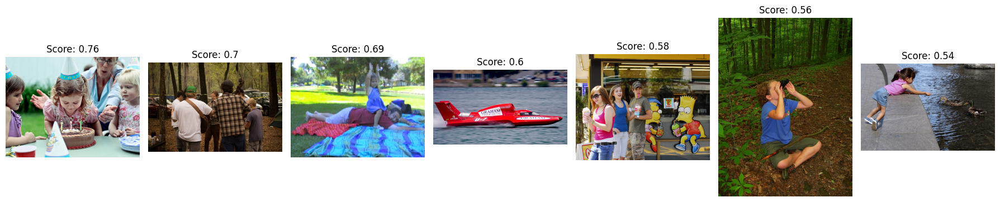

___________________________________________________________________________________
Введенная фраза:Boy flying a distant kite .
This image is unavailable in your country in compliance with local laws
___________________________________________________________________________________
Введенная фраза:kids play ultimate Frisbee .
This image is unavailable in your country in compliance with local laws
___________________________________________________________________________________
Введенная фраза:A girl in a purple shirt feeding ducks
This image is unavailable in your country in compliance with local laws
___________________________________________________________________________________


In [63]:
for request in random_request:
    predict_test_net(request)
    print('___________________________________________________________________________________')

## 8. Финальный вывод

Мы загрузили информацию для изучения.
Написали специальную функцию, которая объединяет мнения экспертов большинством голосов и приводит их к шкале от 0 до 1.
Совместили набор данных для обучения с данными, где присутствуют объединенные экспертные оценки. Убрали строки без таких оценок.
Создали список слов, которые стоит избегать, так как они связаны с детьми или группами детей в возрасте от 0 до 16 лет.
Очистили данные обучающего набора.
Преобразовали текстовые комментарии обучающего набора и перевели их в числовые векторы с использованием метода tf-idf.
С использованием сверточной нейронной сети ResNet-50, заранее обученной на наборе данных ImageNet, преобразовали изображения обучающего набора в числовые векторы.
Совместили вектора изображений и текста. Выделили признаки и целевую переменную.
Обучили четыре модели:

- Линейная регрессия с регуляризацией

- LightGBM

- Нейронная сеть

- Константная модель

В качестве метрики оценки модели выбрали RMSE. Она показывает, насколько в среднем прогноз отличается от реальных значений, более чувствительна к выбросам и имеет ту же размерность, что и целевая переменная.
Наилучший результат показала нейронная сеть. Мы продолжили работу с этой моделью и протестировали ее на тестовых данных (10 случайных изображений).
Согласно визуальной оценке результатов, модель показала неудовлетворительные результаты, редко возвращая правильные изображения. Таким образом, метод требует значительной доработки. Возможно, стоит использовать более глубокую нейронную сеть с большими вычислительными ресурсами. Также улучшение качества фотографий и увеличение объема данных могут улучшить метрику.